In [152]:
import pandas as pd
import numpy as np
import sklearn 
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

# PRIMARY QUESTIONS:
## What factors are most highly correlated with popularity and rating?
### What are the most popular genres?
### Which genres have the highest median popularity?
### Does the gender of the author impact the popularity/rating?
### What impact does page number have?
### What impact does being a part of a series have?
### What impact do awards have?
### What keywords are most popular?  What keywords are most popular in the most popular books?

## First things first - let's clean and explore

In [153]:
df = pd.read_csv('goodreads_books.csv', encoding='utf-8')
# import csv into dataframe

In [154]:
df.head()

,id,title,link,series,cover_link,author,author_link,rating_count,review_count,average_rating,...,isbn13,asin,settings,characters,awards,amazon_redirect_link,worldcat_redirect_link,recommended_books,books_in_series,description
0,630104,Inner Circle,https://www.goodreads.com//book/show/630104.In...,(Private #5),https://i.gr-assets.com/images/S/compressed.ph...,"Kate Brian, Julian Peploe",https://www.goodreads.com/author/show/94091.Ka...,7597,196,4.03,...,9781416950417,NaN,NaN,NaN,NaN,https://www.goodreads.com//book_link/follow/17...,https://www.goodreads.com//book_link/follow/8?...,"726458, 726458, 1537534, 3047848, 1651302, 304...","381489, 381501, 352428, 630103, 1783281, 17832...",Reed Brennan arrived at Easton Academy expecti...
1,9487,A Time to Embrace,https://www.goodreads.com//book/show/9487.A_Ti...,(Timeless Love #2),https://i.gr-assets.com/images/S/compressed.ph...,Karen Kingsbury,https://www.goodreads.com/author/show/3159984....,4179,177,4.35,...,9781595542328,NaN,NaN,NaN,NaN,https://www.goodreads.com//book_link/follow/17...,https://www.goodreads.com//book_link/follow/8?...,"127352, 127352, 40642197, 127353, 127354, 3891...",115036,"Ideje az Ã¶lelÃ©snek TÃ¶rtÃ©net a remÃ©nyrÅl,..."
2,6050894,Take Two,https://www.goodreads.com//book/show/6050894-t...,(Above the Line #2),https://i.gr-assets.com/images/S/compressed.ph...,Karen Kingsbury,https://www.goodreads.com/author/show/3159984....,6288,218,4.23,...,NaN,NaN,"Bloomington, Indiana(United States)",NaN,NaN,https://www.goodreads.com//book_link/follow/17...,https://www.goodreads.com//book_link/follow/8?...,"706250, 706250, 666481, 11942636, 706241, 1273...","4010795, 40792877, 7306261",Filmmakers Chase Ryan and Keith Ellison have c...
3,39030,Reliquary,https://www.goodreads.com//book/show/39030.Rel...,(Pendergast #2),https://i.gr-assets.com/images/S/compressed.ph...,"Douglas Preston, Lincoln Child",https://www.goodreads.com/author/show/12577.Do...,38382,1424,4.01,...,9780765354952,NaN,"New York State(United States) New York City, N...","Aloysius X.L. Pendergast, Margo Green, William...",NaN,https://www.goodreads.com//book_link/follow/17...,https://www.goodreads.com//book_link/follow/8?...,"39026, 39026, 11007668, 3986318, 51887330, 194...","67035, 39031, 39033, 136637, 136638, 30068, 39...",NaN
4,998,The Millionaire Next Door: The Surprising Secr...,https://www.goodreads.com//book/show/998.The_M...,NaN,https://i.gr-assets.com/images/S/compressed.ph...,"Thomas J. Stanley, William D. Danko",https://www.goodreads.com/author/show/659.Thom...,72168,3217,4.04,...,9780671015206,NaN,NaN,NaN,Independent Publisher Book Award (IPPY) Nomine...,https://www.goodreads.com//book_link/follow/17...,https://www.goodreads.com//book_link/follow/8?...,"1052, 1052, 763362, 69571, 78427, 30186948, 10...",NaN,The incredible national bestseller that is cha...


In [155]:
df.dtypes

id                          int64
title                      object
link                       object
series                     object
cover_link                 object
author                     object
author_link                object
rating_count                int64
review_count                int64
average_rating            float64
five_star_ratings           int64
four_star_ratings           int64
three_star_ratings          int64
two_star_ratings            int64
one_star_ratings            int64
number_of_pages           float64
date_published             object
publisher                  object
original_title             object
genre_and_votes            object
isbn                       object
isbn13                     object
asin                       object
settings                   object
characters                 object
awards                     object
amazon_redirect_link       object
worldcat_redirect_link     object
recommended_books          object
books_in_serie

In [156]:
df = df.drop(columns=['link', 'series', 'cover_link', 'author_link', 'original_title', 'isbn', 'isbn13', 'asin', 'settings', 'characters', 'amazon_redirect_link', 'worldcat_redirect_link', 'recommended_books'])
# Get rid of the columns that won't be of use for this project

In [157]:
df.shape
# that's more like it

(52199, 18)

In [158]:
df.dtypes
# Looks good to me :) 
# sidenote: if they are indexed, do I really need the id?

id                      int64
title                  object
author                 object
rating_count            int64
review_count            int64
average_rating        float64
five_star_ratings       int64
four_star_ratings       int64
three_star_ratings      int64
two_star_ratings        int64
one_star_ratings        int64
number_of_pages       float64
date_published         object
publisher              object
genre_and_votes        object
awards                 object
books_in_series        object
description            object
dtype: object

In [159]:
df['number_of_pages'].sort_values()

21789    0.0
37718    0.0
37632    0.0
33033    0.0
24641    0.0
        ... 
51815    NaN
51881    NaN
51921    NaN
51925    NaN
52180    NaN
Name: number_of_pages, Length: 52199, dtype: float64

In [160]:
print(df[df['number_of_pages'] < 1].count()) # 167 books with 0 pages
print(df[df['number_of_pages'].isnull()].count()) # 2330 books with NaN pages
# Lots of 0s and NaNs
# Let's go ahead and remove those pesky 0s and NaNs

id                    167
title                 167
author                167
rating_count          167
review_count          167
average_rating        167
five_star_ratings     167
four_star_ratings     167
three_star_ratings    167
two_star_ratings      167
one_star_ratings      167
number_of_pages       167
date_published        166
publisher             166
genre_and_votes       151
awards                  6
books_in_series        49
description           148
dtype: int64
id                    2330
title                 2330
author                2330
rating_count          2330
review_count          2330
average_rating        2330
five_star_ratings     2330
four_star_ratings     2330
three_star_ratings    2330
two_star_ratings      2330
one_star_ratings      2330
number_of_pages          0
date_published        1667
publisher             1314
genre_and_votes       1874
awards                  95
books_in_series        780
description           1979
dtype: int64


In [161]:
df = df[df['number_of_pages'] > 30]
df.dropna
df['number_of_pages'].sort_values()
# successfully dropped the NaNs and any books with fewer than 30 pages

7515        31.0
9087        31.0
37094       31.0
29624       31.0
18776       31.0
          ...   
9150      8124.0
46657     8245.0
49801     8258.0
12024    11095.0
771      14777.0
Name: number_of_pages, Length: 49041, dtype: float64

<AxesSubplot:>

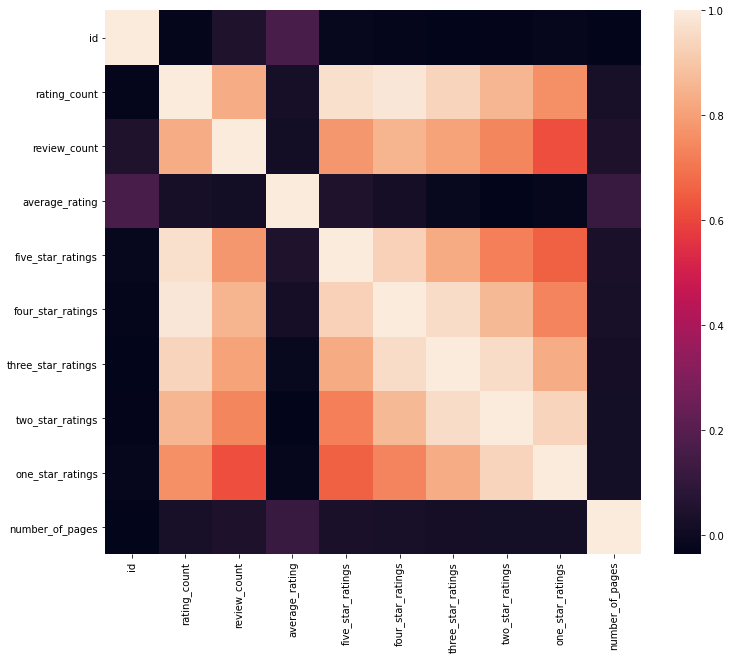

In [162]:
corr_matrix = df.corr()
fig, ax = plt.subplots(figsize=(12,10))
sns.heatmap(corr_matrix)
# I guess it makes sense that none of these numerical columns correlate with average rating in any useful way
# Maybe the boost in rating for larger books will be an interesting lead, though the correlation is weak

In [163]:
fig = px.histogram(df, x="average_rating")
fig.show()
# This shows a strange spike at 5 (and 1) star rating.  Let's investigate
# There are also several spikes around 3, 3.5, 4, 4.5 etc.  My running assumption is that this is the count of the many books that don't have enough reviews to get them into the grey area between ratings

In [164]:
# It looks like most of the 5 star average books typically don't have many ratings.
# It may be a good idea to exclude all books with fewer than 50 ratings.
df[df['average_rating'] == 5.00]['rating_count'].describe()

count    605.000000
mean       3.909091
std       15.572199
min        1.000000
25%        1.000000
50%        2.000000
75%        4.000000
max      375.000000
Name: rating_count, dtype: float64

In [165]:
df[df['average_rating'] == 5.00]['rating_count'].sort_values(ascending=False)
# What's that one amazing book?

44353    375
7905      37
41683     35
11932     32
9981      28
        ... 
14365      1
14385      1
14553      1
14880      1
12961      1
Name: rating_count, Length: 605, dtype: int64

In [166]:
df[df.index==44353]
# What a strange little book

,id,title,author,rating_count,review_count,average_rating,five_star_ratings,four_star_ratings,three_star_ratings,two_star_ratings,one_star_ratings,number_of_pages,date_published,publisher,genre_and_votes,awards,books_in_series,description
44353,45021686,The Devil's Deceptions: Is There Life After De...,Ginger Baum,375,15,5.0,374,1,0,0,0,50.0,April 9th 2019,NaN,NaN,NaN,NaN,In a world that is overflowing with man's trad...


In [167]:
df = df[df['rating_count'] > 1000]
# create a dataframe that only contains books with more than 1000 ratings

In [168]:
df['rating_count'].min()
# just double checking

1001

In [169]:
px.histogram(df, x = 'average_rating')
# looks much more regular
# it seems to be a normally distributed 

# Book Length
### How does book length effect average rating and the number of ratings?

In [170]:
import plotly.express as px

In [171]:
px.scatter(data_frame=df, x='number_of_pages', y='average_rating', hover_name="title")
# those outliars...
# ps A+ on Wheel of Time and The Story of Civilization.  Though those are both totally series, not books
# there seems to be a trend here.  I don't think it's worth regressing

In [172]:
df_red = df.loc[df['number_of_pages'] < 2000]
# what will it look like if we limit it to less than 2000 pages?

In [173]:
px.scatter(data_frame=df_red, x='number_of_pages', y='average_rating', hover_name="title", opacity=0.4, width=1000, height=800, range_y=[2.5, 5], range_x=[0,2000])


In [175]:
px.scatter(data_frame=df_red, x='number_of_pages', y='rating_count', hover_name="title", range_x=[0,2000])
# makes sense that there's a 'sweet spot' around 300-400 pages.  
# this does cast some doubt on the 'high page number, high rating' hypothesis

In [176]:
px.scatter(data_frame=df_red, x='average_rating', y='review_count', hover_name="title")
# what about the relationship between our two target variables?

In [177]:
from re import sub, match
def parse_year(date):
    if type(date) == type(float("nan")):
        return
    year_check = match(r'.*([1-3][0-9]{3})', date)
    if year_check != None:
        return int(year_check.group(1))
    
df_red['year_published'] = df_red['date_published'].apply(parse_year)

# now, to give parse each dates published into years published.  That will make the analysis much easier.
# some of the formats for the 'date published' were really tricky.  This semmed the easier solution.  That degree of granularity wouldn't have been useful for this project anyway

/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# Should it be a series?

In [178]:
# Let's first create a df_pop dataframe of the more popular books that have greater than 100,000 ratings
df_pop = df_red[df_red.rating_count > 300000]

In [179]:
not_series = df_red[df_red['books_in_series'].isnull()]
not_series.describe()
# create not_series and series dataframes to see if there is an important difference

,id,rating_count,review_count,average_rating,five_star_ratings,four_star_ratings,three_star_ratings,two_star_ratings,one_star_ratings,number_of_pages,year_published
count,1.532800e+04,1.532800e+04,15328.000000,15328.000000,1.532800e+04,1.532800e+04,15328.000000,15328.000000,15328.000000,15328.000000,15224.000000
mean,7.103983e+06,3.103174e+04,1764.020942,3.943471,1.202099e+04,1.053011e+04,6042.206550,1698.729841,739.705245,332.641701,1983.211377
std,1.073331e+07,1.393832e+05,5467.183713,0.276596,6.212981e+04,4.463108e+04,24690.040815,7679.424766,3993.360957,177.150879,62.577590
min,2.100000e+01,1.001000e+03,5.000000,2.370000,6.000000e+01,4.900000e+01,32.000000,0.000000,0.000000,31.000000,1000.000000
25%,1.031498e+05,2.429750e+03,200.000000,3.770000,8.067500e+02,8.240000e+02,506.000000,130.000000,44.000000,227.000000,1979.000000
50%,8.153515e+05,5.777000e+03,447.000000,3.950000,1.900500e+03,1.992000e+03,1226.500000,324.000000,112.000000,308.000000,2002.000000
75%,1.092282e+07,1.581575e+04,1233.250000,4.140000,5.444500e+03,5.573750e+03,3375.250000,911.250000,326.000000,400.000000,2010.000000
max,5.346087e+07,3.659574e+06,154147.000000,4.780000,1.738768e+06,1.228468e+06,776469.000000,245790.000000,135372.000000,1948.000000,2020.000000


In [180]:
series = df_red[df_red['books_in_series'].notnull()]
series.describe()
# it seems to be that there isn't a huge difference in number of rating average or median for series vs nonseries.  
# I'm actually really surprised by this one.
# the average and median rating is slightly higher.  That's the only significant difference

,id,rating_count,review_count,average_rating,five_star_ratings,four_star_ratings,three_star_ratings,two_star_ratings,one_star_ratings,number_of_pages,year_published
count,1.659300e+04,1.659300e+04,16593.000000,16593.000000,1.659300e+04,1.659300e+04,16593.000000,16593.000000,16593.000000,16593.000000,16577.000000
mean,8.963082e+06,2.980793e+04,1487.509191,4.052371,1.309056e+04,9.652533e+03,5131.486350,1332.490870,600.852588,355.875490,1999.743802
std,1.030712e+07,1.546423e+05,4690.839994,0.242663,8.458018e+04,4.327383e+04,21461.423179,7273.436909,5603.152493,180.766072,35.429503
min,1.000000e+00,1.001000e+03,4.000000,2.730000,9.200000e+01,1.360000e+02,41.000000,3.000000,0.000000,31.000000,1008.000000
25%,2.462450e+05,3.089000e+03,181.000000,3.890000,1.159000e+03,1.027000e+03,584.000000,127.000000,39.000000,255.000000,1999.000000
50%,6.223474e+06,7.334000e+03,429.000000,4.060000,2.802000e+03,2.502000e+03,1412.000000,313.000000,99.000000,337.000000,2008.000000
75%,1.584827e+07,1.943700e+04,1158.000000,4.220000,7.716000e+03,6.720000e+03,3647.000000,820.000000,282.000000,416.000000,2012.000000
max,5.306386e+07,6.801077e+06,169511.000000,4.820000,4.414877e+06,1.868421e+06,980183.000000,529060.000000,537793.000000,1952.000000,2020.000000


In [187]:
px.scatter(data_frame=df_pop, x='average_rating', y='rating_count', hover_name="title", range_y=[200000,7000000],color=df_pop['books_in_series'].notnull())
# average rating and review count for series and not series books
# For the popular books (above 13000 reviews), does it being a series have an impact?
# is it a series?  True=yes, False=no
# I can't really tell if it matters from here

# so you want to a write a novel...
### when writing fiction, what factors lead to the highest rating and popularity?

# Do awards matter?

In [199]:
not_awarded = df_red[df_red['awards'].isnull()]
not_awarded.describe()

,id,rating_count,review_count,average_rating,five_star_ratings,four_star_ratings,three_star_ratings,two_star_ratings,one_star_ratings,number_of_pages,year_published
count,2.269500e+04,2.269500e+04,22695.000000,22695.000000,2.269500e+04,22695.000000,22695.000000,22695.000000,22695.000000,22695.000000,22586.000000
mean,7.784380e+06,1.709927e+04,835.600617,4.003711,6.761837e+03,5693.875215,3379.356334,895.915929,368.288081,338.862481,1989.016205
std,1.028122e+07,7.475267e+04,2177.097944,0.271029,3.415411e+04,23031.413887,13473.443033,4207.925681,2192.780002,184.168656,56.645284
min,1.100000e+01,1.001000e+03,4.000000,2.370000,7.400000e+01,49.000000,32.000000,0.000000,0.000000,31.000000,1000.000000
25%,1.570275e+05,2.373000e+03,157.000000,3.830000,8.490000e+02,785.000000,468.000000,109.000000,35.000000,230.000000,1990.000000
50%,1.777244e+06,5.226000e+03,333.000000,4.020000,1.886000e+03,1761.000000,1049.000000,252.000000,83.000000,320.000000,2006.000000
75%,1.333190e+07,1.274050e+04,784.000000,4.190000,4.766500e+03,4334.000000,2567.000000,627.500000,215.000000,400.000000,2012.000000
max,5.346087e+07,2.908332e+06,64571.000000,4.820000,1.564990e+06,793991.000000,541878.000000,200851.000000,118032.000000,1952.000000,2020.000000


In [200]:
awarded = df_red[df_red['awards'].notnull()]
awarded.describe()

,id,rating_count,review_count,average_rating,five_star_ratings,four_star_ratings,three_star_ratings,two_star_ratings,one_star_ratings,number_of_pages,year_published
count,9.226000e+03,9.226000e+03,9226.000000,9226.000000,9.226000e+03,9.226000e+03,9226.000000,9226.000000,9226.000000,9226.000000,9215.000000
mean,8.773874e+06,6.310313e+04,3550.530783,3.991145,2.688158e+04,2.084842e+04,10954.606872,3014.886191,1403.625732,359.125298,1998.724145
std,1.116854e+07,2.450307e+05,8508.959663,0.249890,1.269791e+05,7.218067e+04,36804.526670,12103.593534,8389.779087,166.271263,32.115902
min,1.000000e+00,1.008000e+03,14.000000,2.750000,6.000000e+01,1.700000e+02,85.000000,8.000000,2.000000,32.000000,1177.000000
25%,1.286578e+05,4.771250e+03,393.000000,3.830000,1.549250e+03,1.680000e+03,954.000000,230.000000,75.000000,259.000000,1995.000000
50%,2.767422e+06,1.281550e+04,1046.000000,4.000000,4.396500e+03,4.622000e+03,2553.000000,600.000000,201.000000,340.000000,2007.000000
75%,1.572403e+07,3.987975e+04,2990.500000,4.170000,1.473500e+04,1.437425e+04,7414.750000,1778.750000,667.000000,423.000000,2012.000000
max,5.341534e+07,6.801077e+06,169511.000000,4.760000,4.414877e+06,1.868421e+06,980183.000000,529060.000000,537793.000000,1796.000000,2019.000000


In [201]:
# awarded books are much more popular, though the average rating remains the same
# of the books that are popular, what impact does 'awardedness' have?
px.scatter(data_frame=df_pop, x='average_rating', y='rating_count', hover_name="title", color=df_pop['awards'].notnull())


# What role does the author's gender play?

In [202]:
from nameparser import HumanName
import gender_guesser.detector

gender = gender_guesser.detector.Detector()
name = HumanName

df_red['author_gender'] = df_red['author'].apply(lambda full_name: gender.get_gender(name(full_name).first))
df_pop['author_gender'] = df_pop['author'].apply(lambda full_name: gender.get_gender(name(full_name).first))

df_red['author_gender'].value_counts()

/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



male             12640
female           12254
unknown           4698
mostly_female     1119
mostly_male       1013
andy               197
Name: author_gender, dtype: int64

In [203]:
df_dudes = df_red[df_red.author_gender == 'male']
df_mostly_dudes = df_red[df_red.author_gender == 'mostly_male']

df_male = pd.merge(df_dudes, df_mostly_dudes, how='outer')

df_chicks = df_red[df_red.author_gender == 'female']
df_mostly_chicks = df_red[df_red.author_gender == 'mostly_female']

df_female = pd.merge(df_chicks, df_mostly_chicks, how='outer')

In [204]:
df_male = pd.merge(df_dudes, df_mostly_dudes, how='outer')

In [205]:
df_chicks = df_red[df_red.author_gender == 'female']
df_mostly_chicks = df_red[df_red.author_gender == 'mostly_female']

In [206]:
df_female = pd.merge(df_chicks, df_mostly_chicks, how='outer')

In [207]:
df_female['average_rating'].describe()

count    13373.000000
mean         3.979898
std          0.258610
min          2.570000
25%          3.820000
50%          3.990000
75%          4.160000
max          4.780000
Name: average_rating, dtype: float64

In [226]:
df_male['average_rating'].describe()

count    13653.000000
mean         4.009029
std          0.261103
min          2.540000
25%          3.850000
50%          4.030000
75%          4.190000
max          4.820000
Name: average_rating, dtype: float64

In [227]:
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Histogram(
    x=df_male['average_rating'],
    name='male', # name used in legend and hover labels
    xbins=dict(),
    marker_color='orange',
    opacity=0.75,
    nbinsx = 60
))
fig.add_trace(go.Histogram(
    x=df_female['average_rating'],
    name='female',
    xbins=dict(),
    marker_color='#116530',
))
fig.update_layout(
    title_text='Sampled Results', # title of plot
    xaxis_title_text='Value', # xaxis label
    yaxis_title_text='Count', # yaxis label
    bargap=.4, # gap between bars of adjacent location coordinates
    bargroupgap=0 # gap between bars of the same location coordinates           
             
             
             )
fig.show()

In [228]:
def find_dif(male, female, ranj):
    male_minus_female = {}
    for i in ranj:
        male_minus_female[i] = (female[i] - male[i])/(male[i]+female[i])*100
    return male_minus_female

difference = find_dif(df_male.year_published.value_counts(), df_female.year_published.value_counts(), range(1950,2020))

In [230]:
df = pd.DataFrame(list(difference.items()),columns = ['year','male_minus_female']) 
df

,year,male_minus_female
0,1950,-30.000000
1,1951,-33.333333
2,1952,-38.461538
3,1953,-27.586207
4,1954,-61.403509
...,...,...
65,2015,32.893289
66,2016,38.533541
67,2017,28.761905
68,2018,38.586957


In [232]:
fig = px.bar(df, x=df.year, y=df.male_minus_female)
fig.update_xaxes(title='Percent Difference of Female to Male Authored books by Year')
fig.update_yaxes(title=None)
fig.show()

### What keywords are most popular?  What keywords are most popular in the most popular books?

In [233]:
import nltk
import urllib.request
from PIL import Image
from io import BytesIO
from nltk.corpus import stopwords
from re import sub, match
from wordcloud import WordCloud, ImageColorGenerator
from random import shuffle
from matplotlib import rcParams

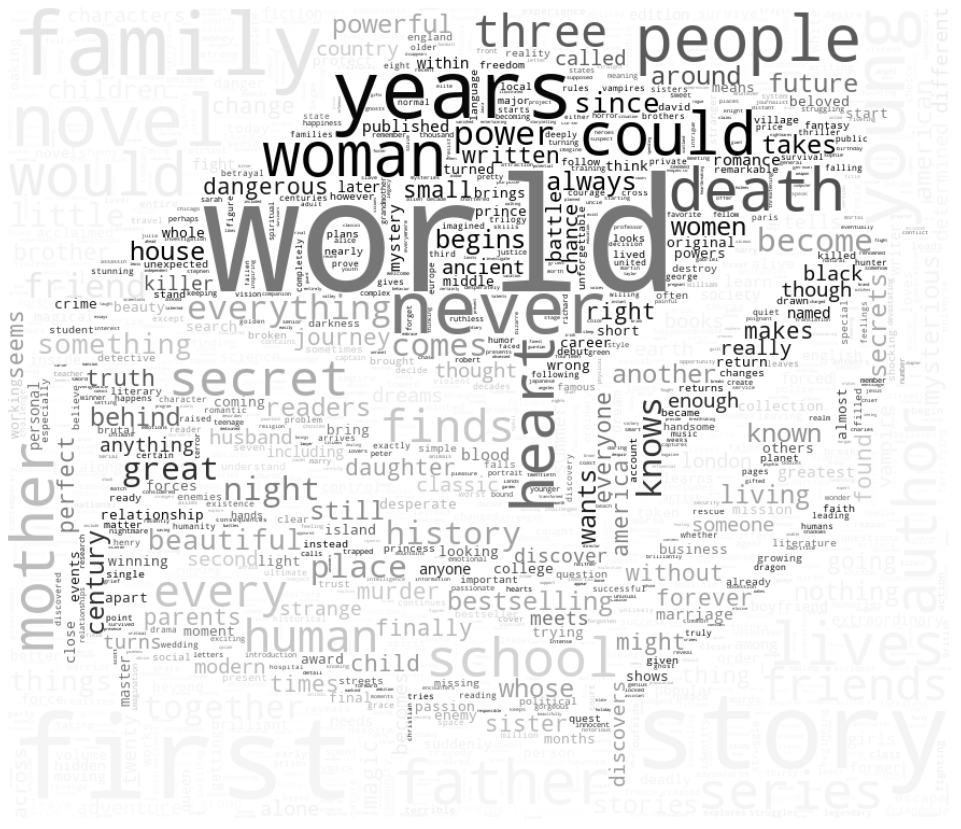

In [234]:
# Borrowed from https://www.kaggle.com/austinreese/goodreads-eda

sw = stopwords.words('english')
words = []

for text in df_red["description"]:
    if type(text) == type(float("nan")):
        continue
    text = text.lower()
    text = sub(r'\[.*?\]', '', text)
    text = sub(r'([.!,?])', r' \1 ', text)
    text = sub(r'[^a-zA-Z.,!?]+', r' ', text)
    text = [i for i in text.split() if i not in sw]
    for word in text:
        words.append(word)

word_freq = nltk.FreqDist([i for i in words if len(i) > 4])
# plt.figure(figsize=(16, 6))
# word_freq.plot(50)

book_img = 'https://www.pinclipart.com/picdir/middle/365-3651885_book-black-and-white-png-peoplesoft-learn-peoplesoft.png'
with urllib.request.urlopen(book_img) as url:
    f = BytesIO(url.read())
img = Image.open(f)

mask = np.array(img)
img_color = ImageColorGenerator(mask)

wc = WordCloud(background_color='white',
              mask=mask,
              max_font_size=2000,
              max_words=1500,
              random_state=20)
wcloud = wc.generate_from_frequencies(word_freq)
plt.figure(figsize=(20, 15))
plt.axis('off')
plt.imshow(wc.recolor(color_func=img_color), interpolation="bilinear")
plt.show()

In [236]:
most_popular = df_red[df_red['rating_count']>500000]

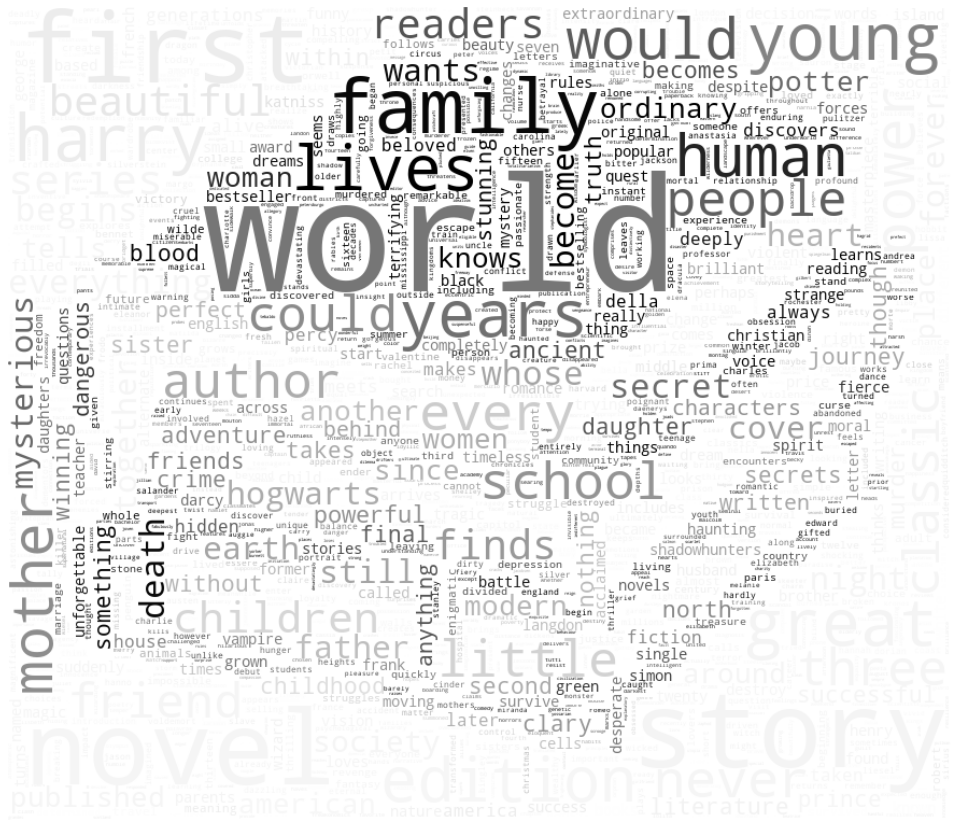

In [239]:
# Borrowed from https://www.kaggle.com/austinreese/goodreads-eda

sw = stopwords.words('english')
words = []

for text in most_popular["description"]:
    if type(text) == type(float("nan")):
        continue
    text = text.lower()
    text = sub(r'\[.*?\]', '', text)
    text = sub(r'([.!,?])', r' \1 ', text)
    text = sub(r'[^a-zA-Z.,!?]+', r' ', text)
    text = [i for i in text.split() if i not in sw]
    for word in text:
        words.append(word)

word_freq = nltk.FreqDist([i for i in words if len(i) > 4])
# plt.figure(figsize=(16, 6))
# word_freq.plot(50)

book_img = 'https://www.pinclipart.com/picdir/middle/365-3651885_book-black-and-white-png-peoplesoft-learn-peoplesoft.png'
with urllib.request.urlopen(book_img) as url:
    f = BytesIO(url.read())
img = Image.open(f)

mask = np.array(img)
img_color = ImageColorGenerator(mask)

wc = WordCloud(background_color='white',
              mask=mask,
              max_font_size=2000,
              max_words=1500,
              random_state=20)
wcloud = wc.generate_from_frequencies(word_freq)
plt.figure(figsize=(20, 15))
plt.axis('off')
plt.imshow(wc.recolor(color_func=img_color), interpolation="bilinear")
plt.show()

In [172]:
import re

In [174]:
re.sub('\d+', '', df_red['genre_and_votes'][0].split(", ")[0])

'Young Adult '

In [175]:
df_red['genre_and_votes'][0]

'Young Adult 161, Mystery 45, Romance 32'

In [177]:
df_red["genre_3"] = df_red['genre_and_votes'].astype(str).apply(lambda s: [re.sub('\d+', '', genre).strip() for genre in s.split(", ")][:3])



In [178]:
df_red.loc[0]

id                                                               630104
title                                                      Inner Circle
author                                        Kate Brian, Julian Peploe
rating_count                                                       7597
review_count                                                        196
average_rating                                                     4.03
five_star_ratings                                                  3045
four_star_ratings                                                  2323
three_star_ratings                                                 1748
two_star_ratings                                                    389
one_star_ratings                                                     92
number_of_pages                                                   220.0
date_published                                         January 1st 2007
publisher                       Simon  Schuster Books for Young 

In [183]:
df_red[['genre1','genre2', "genre3"]] = pd.DataFrame(df_red.genre_3.tolist(), index= df_red.index)


In [184]:
df_red

,id,title,author,rating_count,review_count,average_rating,five_star_ratings,four_star_ratings,three_star_ratings,two_star_ratings,...,genre_and_votes,awards,books_in_series,description,author_gender,year_published,genre_3,genre1,genre2,genre3
0,630104,Inner Circle,"Kate Brian, Julian Peploe",7597,196,4.03,3045,2323,1748,389,...,"Young Adult 161, Mystery 45, Romance 32",NaN,"381489, 381501, 352428, 630103, 1783281, 17832...",Reed Brennan arrived at Easton Academy expecti...,male,2007.0,"[Young Adult, Mystery, Romance]",Young Adult,Mystery,Romance
1,9487,A Time to Embrace,Karen Kingsbury,4179,177,4.35,2255,1290,518,93,...,"Christian Fiction 114, Christian 45, Fiction 3...",NaN,115036,"Ideje az Ã¶lelÃ©snek TÃ¶rtÃ©net a remÃ©nyrÅl,...",female,2006.0,"[Christian Fiction, Christian, Fiction]",Christian Fiction,Christian,Fiction
2,6050894,Take Two,Karen Kingsbury,6288,218,4.23,3000,2020,1041,183,...,"Christian Fiction 174, Christian 81, Fiction 58",NaN,"4010795, 40792877, 7306261",Filmmakers Chase Ryan and Keith Ellison have c...,female,2009.0,"[Christian Fiction, Christian, Fiction]",Christian Fiction,Christian,Fiction
3,39030,Reliquary,"Douglas Preston, Lincoln Child",38382,1424,4.01,12711,15407,8511,1429,...,"Thriller 626, Mystery 493, Horror 432, Fiction...",NaN,"67035, 39031, 39033, 136637, 136638, 30068, 39...",NaN,male,1997.0,"[Thriller, Mystery, Horror]",Thriller,Mystery,Horror
4,998,The Millionaire Next Door: The Surprising Secr...,"Thomas J. Stanley, William D. Danko",72168,3217,4.04,27594,25219,14855,3414,...,"Economics-Finance 1162, Nonfiction 910, Busine...",Independent Publisher Book Award (IPPY) Nomine...,NaN,The incredible national bestseller that is cha...,male,1995.0,"[Economics-Finance, Nonfiction, Business]",Economics-Finance,Nonfiction,Business
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52194,15743072,The Stranger I Married,Sylvia Day,13295,805,3.87,4220,4733,3116,848,...,"Romance-Historical Romance 335, Romance 312, H...",NaN,NaN,"The unabridged, downloadable audiobook edition...",female,2007.0,"[Romance-Historical Romance, Romance, Historical]",Romance-Historical Romance,Romance,Historical
52195,18143905,The Opposite of Loneliness: Essays and Stories,Marina Keegan,42609,4282,3.84,12461,15191,11202,3011,...,"Nonfiction 1307, Short Stories 766, Writing-Es...","Goodreads Choice Award for Nonfiction (2014), ...",NaN,An affecting and hope-filled posthumous collec...,female,2014.0,"[Nonfiction, Short Stories, Writing-Essays]",Nonfiction,Short Stories,Writing-Essays
52196,1466878,Sadako will leben,Karl Bruckner,1583,64,4.17,673,592,251,51,...,"Fiction 13, Childrens 11, Historical-Historica...","Austrian National Prize (1961), City of Vienna...",NaN,"6. August 1945, 8 Uhr 15 Minuten - die kleine ...",male,1961.0,"[Fiction, Childrens, Historical-Historical Fic...",Fiction,Childrens,Historical-Historical Fiction
52197,630103,Confessions,Kate Brian,8815,258,4.09,3760,2734,1780,435,...,"Young Adult 182, Mystery 52, Romance 34",NaN,"381489, 381501, 352428, 630104, 1783281, 17832...",Sometimes the truth hurts.... Reed Brennan...,female,2007.0,"[Young Adult, Mystery, Romance]",Young Adult,Mystery,Romance


In [189]:
(df_red.genre1 == 'Young Adult').value_counts()

False    32190
True      2772
Name: genre1, dtype: int64

/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/seaborn/dis

/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

/Users/trevorban/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.



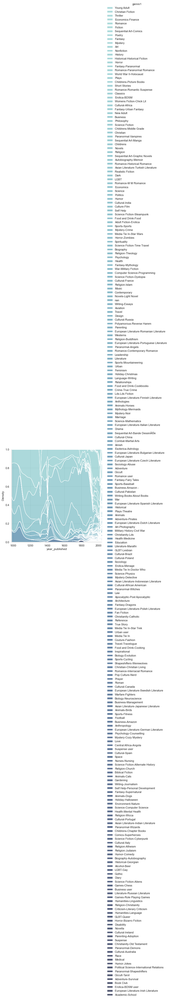

In [225]:

import seaborn as sns
sns.set_theme(style="whitegrid")

# Plot the distribution of clarity ratings, conditional on carat
sns.displot(
    data=df_red,
    x="year_published", hue="genre1",
    kind="kde",
    height=6,
    multiple="fill", clip=(0, None),
    palette="ch:rot=-.25,hue=1,light=.75"
)

In [200]:
df_red['genre1'].value_counts()

Fiction                                   4971
Fantasy                                   4164
Young Adult                               2772
Romance                                   2636
Nonfiction                                1930
                                          ... 
European Literature-Swedish Literature       1
Aviation                                     1
Book Club                                    1
Cultural-Ireland                             1
Alcohol-Beer                                 1
Name: genre1, Length: 254, dtype: int64

In [205]:
# Create a second dataframe with genre occurences by year.  This will be put into the kde sns distplot
# each row is a genre, each column is a year.
# how do I create this?  

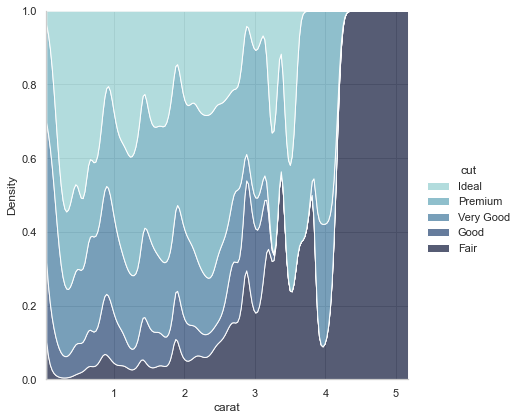

In [219]:
import seaborn as sns
sns.set_theme(style="whitegrid")

# Load the diamonds dataset
diamonds = sns.load_dataset("diamonds")

# Plot the distribution of clarity ratings, conditional on carat
sns.displot(
    data=diamonds,
    x="carat", hue="cut",
    kind="kde", height=6,
    multiple="fill", clip=(0, None),
    palette="ch:rot=-.25,hue=1,light=.75",
)

In [238]:
top_15 = df_red['genre1'].value_counts()[:15]

In [241]:
for i in df_red:
    if i['genre1'] in top_15:
        df_red['top_15_genres'] = i['genre1']
        

TypeError: string indices must be integers

In [247]:
for index, row in df_red.iterrows():
    if row['genre1'] in top_15:
        row['top_15_genres'] = row['genre1']


SyntaxError: 'return' outside function (<ipython-input-247-35a04f583358>, line 4)

In [ ]:
df_red

# failed regressor

In [189]:
df_popular = df_popular.sort_values(by='number_of_pages')
from sklearn.preprocessing import PolynomialFeatures
X = df_popular.iloc[:, 11].values
X = X.reshape(-1, 1)
y = df_popular.iloc[:, 5].values
y = y.reshape(-1, 1)


In [190]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [195]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
poly_reg = PolynomialFeatures(degree = 2)
X_poly = poly_reg.fit_transform(X_train)
regressor = LinearRegression()
regressor.fit(X_poly, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [196]:
y_pred = regressor.predict(poly_reg.transform(X_test))
np.set_printoptions(precision=2)
print(np.concatenate((y_pred.reshape(len(y_pred),1), y_test.reshape(len(y_test),1)),1))

[[4.   3.96]
 [4.14 4.12]
 [4.05 4.17]
 ...
 [4.   4.15]
 [3.99 3.97]
 [3.96 3.96]]


In [197]:
from sklearn.metrics import r2_score
r2_score(y_test, y_pred)
# oooooh not great

0.02712927573082924

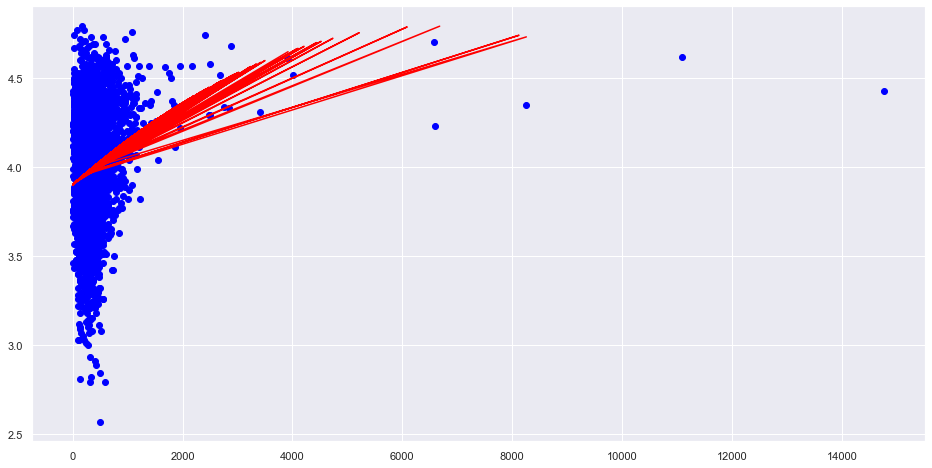

In [198]:
plt.scatter(X_test, y_test, color='blue')
plt.plot(X_train, regressor.predict(X_poly), color='red')
# why am I getting this strange result????